In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy as sp
import statsmodels.api as sm
from matplotlib import animation

sns.set()


from nolitsa import data, dimension, delay, noise, lyapunov
from mpl_toolkits.mplot3d import Axes3D
from statsmodels.tsa.filters.hp_filter import hpfilter

from sklearn.metrics import mutual_info_score
from scipy.stats import chi2_contingency

# Mexico

In [42]:
data_mexico = pd.read_excel(r'C:\Users\ignac\OneDrive - Universidad de Chile\Escritorio\Modelamietno Matematico\Chaos-Presence-SARS-CoV-II\data_bruto\MEXICO_Final_10_18_2020.xlsx', parse_dates=['nombre'], index_col='nombre', skiprows=[0])

MDF_cases = data_mexico['DISTRITO FEDERAL'].dropna()
MX_cases = data_mexico['MEXICO'].dropna()

MDF_deaths = data_mexico['DISTRITO FEDERAL.1'].dropna()
MX_deaths = data_mexico['MEXICO.1'].dropna()

In [43]:
data_mexico

,DISTRITO FEDERAL,MEXICO,Unnamed: 3,DISTRITO FEDERAL.1,MEXICO.1
nombre,,,,,
2020-02-24,1,0,NaN,0.0,0.0
2020-02-25,0,0,NaN,0.0,0.0
2020-02-26,0,0,NaN,0.0,0.0
2020-02-27,3,0,NaN,0.0,0.0
2020-02-28,1,1,NaN,0.0,0.0
...,...,...,...,...,...
2020-10-14,488,104,NaN,25.0,27.0
2020-10-15,328,102,NaN,14.0,15.0
2020-10-16,103,55,NaN,10.0,5.0


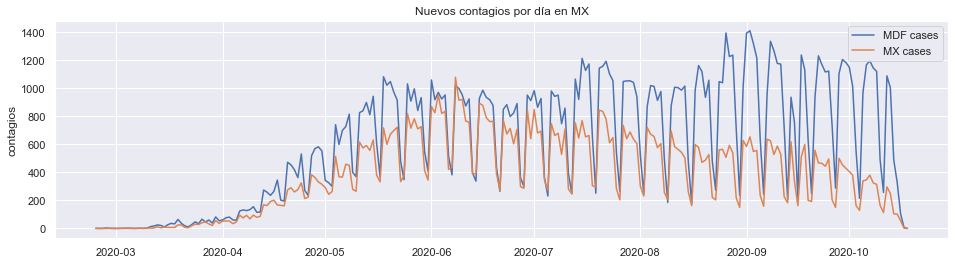

In [44]:
plt.figure(0, figsize=(16,4))
plt.plot(MDF_cases, label='MDF cases')
plt.plot(MX_cases, label='MX cases')
plt.title('Nuevos contagios por día en MX')
plt.ylabel('contagios')
plt.legend()
plt.show()

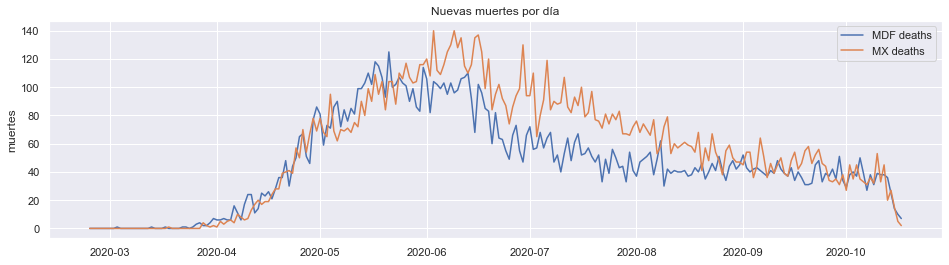

In [45]:
plt.figure(1, figsize=(16,4))
plt.clf()
plt.plot(MDF_deaths, label='MDF deaths')
plt.plot(MX_deaths, label='MX deaths')
plt.title('Nuevas muertes por día')
plt.ylabel('muertes')
plt.legend()
plt.show()

#### Primero pasamos los datos a csv para leerlos en R

In [46]:
MDF_cases = np.array(MDF_cases)
MX_cases = np.array(MX_cases)

MDF_deaths  = np.array(MDF_deaths)
MX_deaths = np.array(MX_deaths)

In [47]:
MDF_cases = MDF_cases / np.max(MDF_cases)
MX_cases = MX_cases / np.max(MX_cases)

MDF_deaths  = MDF_deaths / np.max(MDF_deaths)
MX_deaths = MX_deaths / np.max(MX_deaths)

# np.savetxt('MDF_cases', MDF_cases, delimiter=',')
# np.savetxt('MX_cases', MX_cases, delimiter=',')

# np.savetxt('MDF_deaths', MDF_deaths, delimiter=',')
# np.savetxt('MX_deaths', MX_deaths, delimiter=',')

### Obtenemos el Promedio de Informacion Mutua (AMI) mediante R


In [48]:
AMI_MDF_MX = pd.read_csv(r'C:\Users\ignac\OneDrive - Universidad de Chile\Escritorio\Modelamietno Matematico\Chaos-Presence-SARS-CoV-II\data_para_R\AMI_MDF_MX.csv')
AMI_MDF_MX.head()

,mutual_MDF_cases,mutual_MX_cases,mutual_MDF_deaths,mutual_MX_deaths
0,2.554070,2.544143,2.467192,2.573970
1,1.171579,1.194620,1.273735,1.322962
2,0.980964,1.074284,1.166443,1.310860
3,0.957810,0.989615,1.152238,1.244183
4,0.929479,0.890406,1.159161,1.251878


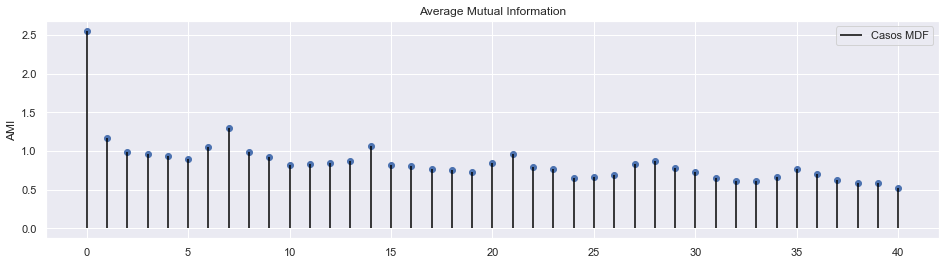

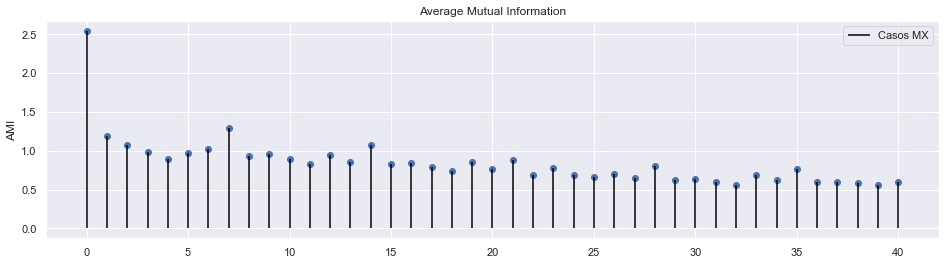

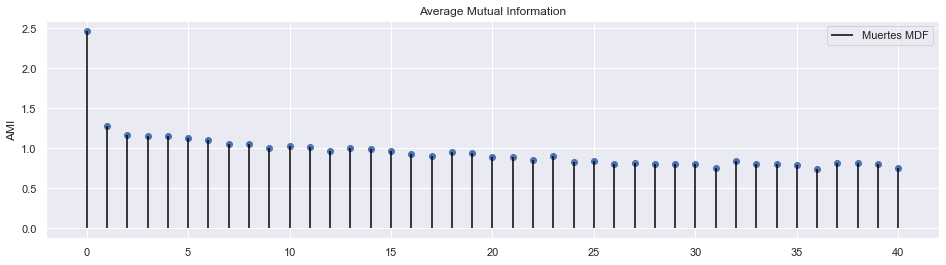

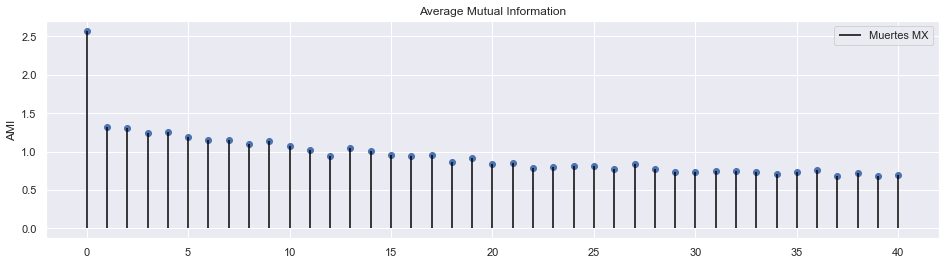

In [50]:
AMI_MDF_cases = np.array(AMI_MDF_MX['mutual_MDF_cases'])
AMI_MX_cases = np.array(AMI_MDF_MX['mutual_MX_cases'])

AMI_MDF_deaths = np.array(AMI_MDF_MX['mutual_MDF_deaths'])
AMI_MX_deaths = np.array(AMI_MDF_MX['mutual_MX_deaths'])

plt.figure(2, figsize=(16,4))
plt.clf()

plt.vlines(np.arange(41), ymin=0, ymax=AMI_MDF_cases, label='Casos MDF', color='black')
plt.scatter(np.arange(41), AMI_MDF_cases, marker='o')

plt.legend()
plt.title('Average Mutual Information')
plt.ylabel('AMI')
plt.show()

plt.figure(3, figsize=(16,4))
plt.clf()

plt.vlines(np.arange(41), ymin=0, ymax=AMI_MX_cases, label='Casos MX', color='black')
plt.scatter(np.arange(41), AMI_MX_cases, marker='o')

plt.legend()
plt.title('Average Mutual Information')
plt.ylabel('AMI')
plt.show()


plt.figure(5, figsize=(16,4))
plt.clf()

plt.vlines(np.arange(41), ymin=0, ymax=AMI_MDF_deaths, label='Muertes MDF', color='black')
plt.scatter(np.arange(41), AMI_MDF_deaths, marker='o')

plt.legend()
plt.title('Average Mutual Information')
plt.ylabel('AMI')
plt.show()

plt.figure(6, figsize=(16,4))
plt.clf()

plt.vlines(np.arange(41), ymin=0, ymax=AMI_MX_deaths, label='Muertes MX', color='black')
plt.scatter(np.arange(41), AMI_MX_deaths, marker='o')

plt.legend()
plt.title('Average Mutual Information')
plt.ylabel('AMI')
plt.show()

In [51]:
delay_MDF_cases = []
delay_MX_cases = []

delay_MDF_deaths = []
delay_MX_deaths = []

for i in range(len(AMI_MDF_cases)-2):
    if AMI_MDF_cases[i] > AMI_MDF_cases[i+1] and AMI_MDF_cases[i+2] > AMI_MDF_cases[i+1]:
        delay_MDF_cases.append(i+1)

for i in range(len(AMI_MX_cases)-2):
    if AMI_MX_cases[i] > AMI_MX_cases[i+1] and AMI_MX_cases[i+2] > AMI_MX_cases[i+1]:
        delay_MX_cases.append(i+1)


for i in range(len(AMI_MDF_deaths)-2):
    if AMI_MDF_deaths[i] > AMI_MDF_deaths[i+1] and AMI_MDF_deaths[i+2] > AMI_MDF_deaths[i+1]:
        delay_MDF_deaths.append(i+1)

for i in range(len(AMI_MX_deaths)-2):
    if AMI_MX_deaths[i] > AMI_MX_deaths[i+1] and AMI_MX_deaths[i+2] > AMI_MX_deaths[i+1]:
        delay_MX_deaths.append(i+1)

print('Tiempos de Retardo para MDF casos:', delay_MDF_cases)
print('Tiempos de Retardo para MX casos:', delay_MX_cases)
print('Tiempos de Retardo para MDF muertes:', delay_MDF_deaths)
print('Tiempos de Retardo para MX muertes:', delay_MX_deaths)

Tiempos de Retardo para MDF casos: [5, 10, 19, 24, 33, 38]
Tiempos de Retardo para MX casos: [4, 8, 11, 13, 15, 18, 20, 22, 25, 27, 29, 32, 34, 36, 39]
Tiempos de Retardo para MDF muertes: [3, 9, 12, 17, 20, 22, 24, 26, 28, 31, 33, 36]
Tiempos de Retardo para MX muertes: [3, 8, 12, 16, 18, 20, 22, 26, 29, 34, 37, 39]


## Obtenemos mediante graficos de separacion espacio-temporales los siguientes Theiler Windows

- tw MDF cases = 5 
- tw MX cases = 8

- tw MDF deaths = 13
- tw MX deaths = 13

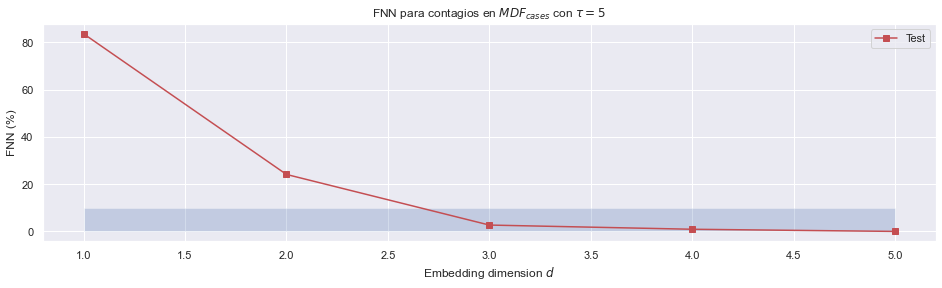

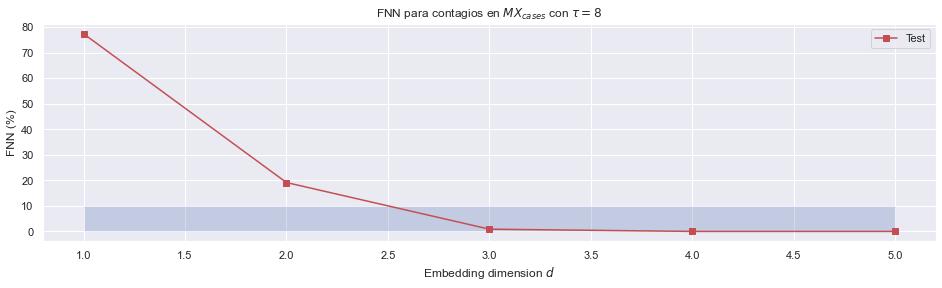

Exception: Could not find any near neighbor with a nonzero distance.  Try increasing the value of maxnum.

In [62]:
dim = np.arange(1, 6)
f1, f2, f3 = dimension.fnn(MDF_cases, tau=5, dim=dim, window=5) #, metric='chebyshev')

plt.figure(7, figsize=(16,4))
plt.clf()
plt.title('FNN para contagios en $MDF_{cases}$ con $\\tau=5$')
plt.xlabel('Embedding dimension $d$')
plt.ylabel('FNN (%)')
plt.plot(dim, 100 * f1, 'rs-', label=r'Test')
#plt.plot(dim, 100 * f2, 'g^--', label=r'Test II')
#plt.plot(dim, 100 * f3, 'rs-', label=r'Test I + II')
plt.fill_between(dim, 10, alpha=0.25)
plt.legend()
plt.show()

f1, f2, f3 = dimension.fnn(MX_cases, tau=4, dim=dim, window=8) #, metric='chebyshev')

plt.figure(8, figsize=(16,4))
plt.clf()
plt.title('FNN para contagios en $MX_{cases}$ con $\\tau=8$')
plt.xlabel('Embedding dimension $d$')
plt.ylabel('FNN (%)')
plt.plot(dim, 100 * f1, 'rs-', label=r'Test')
#plt.plot(dim, 100 * f2, 'g^--', label=r'Test II')
#plt.plot(dim, 100 * f3, 'rs-', label=r'Test I + II')
plt.fill_between(dim, 10, alpha=0.25)
plt.legend()
plt.show()


f1, f2, f3 = dimension.fnn(MDF_deaths, tau=12, dim=dim, window=13, metric='chebyshev')

plt.figure(10, figsize=(16,4))
plt.clf()
plt.title('FNN para contagios en $MDF_{deaths}$ con $\\tau=9$')
plt.xlabel('Embedding dimension $d$')
plt.ylabel('FNN (%)')
plt.plot(dim, 100 * f1, 'rs-', label=r'Test')
#plt.plot(dim, 100 * f2, 'g^--', label=r'Test II')
#plt.plot(dim, 100 * f3, 'rs-', label=r'Test I + II')
plt.fill_between(dim, 10, alpha=0.25)
plt.legend()
plt.show()

f1, f2, f3 = dimension.fnn(MX_deaths, tau=3, dim=dim, window=13) #, metric='chebyshev')

plt.figure(11, figsize=(16,4))
plt.clf()
plt.title('FNN para contagios en $MX_{deaths}$ con $\\tau=3$')
plt.xlabel('Embedding dimension $d$')
plt.ylabel('FNN (%)')
plt.plot(dim, 100 * f1, 'rs-', label=r'Test')
#plt.plot(dim, 100 * f2, 'g^--', label=r'Test II')
#plt.plot(dim, 100 * f3, 'rs-', label=r'Test I + II')
plt.fill_between(dim, 10, alpha=0.25)
plt.legend()
plt.show()

### También estas dimensiones concuerdan con tseriesChaos de R con

- MDF cases = 3
- MX cases = 4

- MDF deaths = 3-6
- MX deaths = 4-6


- tau MDF cases = 5
- tau MX cases = 4

- tau MDF deaths = 3
- tau MX deaths = 3


- tw MDF cases = 5 
- tw MX cases = 8

- tw MDF deaths = 13
- tw CMX deaths = 13

### Reconstruimos el atractor

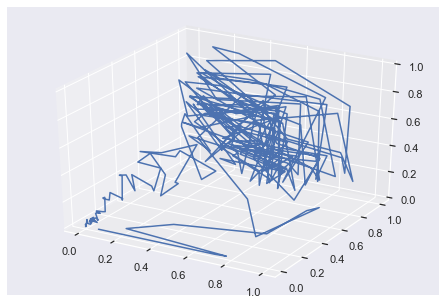

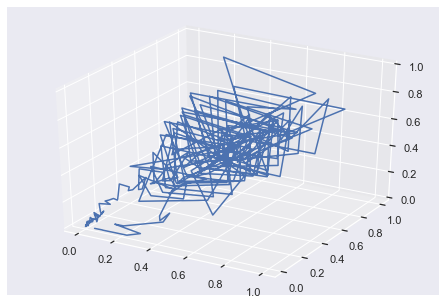

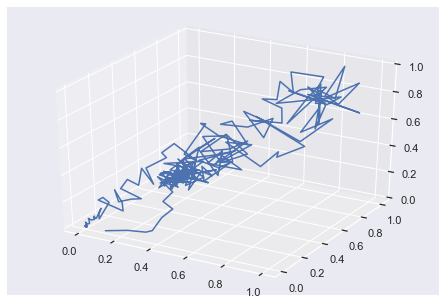

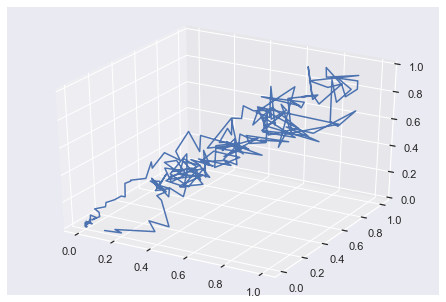

In [63]:
tau_MDF_cases = 5

figg = plt.figure(12)#, figsize=(8, 7))
plt.clf()
axes = Axes3D(figg)
data_lag0 = np.array(MDF_cases)[:-2].flatten()
data_lag1 = np.roll(np.array(MDF_cases), -tau_MDF_cases)[:-2].flatten()
data_lag2 = np.roll(np.array(MDF_cases), -2 * tau_MDF_cases)[:-2].flatten()
axes.plot3D(data_lag0, data_lag1, data_lag2)
figg.add_axes(axes)
plt.show()

tau_MX_cases = 4

figg = plt.figure(13)#, figsize=(8, 7))
plt.clf()
axes = Axes3D(figg)
data_lag0 = np.array(MX_cases)[:-2].flatten()
data_lag1 = np.roll(np.array(MX_cases), -tau_MX_cases)[:-2].flatten()
data_lag2 = np.roll(np.array(MX_cases), -2 * tau_MX_cases)[:-2].flatten()
axes.plot3D(data_lag0, data_lag1, data_lag2)
figg.add_axes(axes)
plt.show()


tau_MDF_deaths = 3

figg = plt.figure(15)#, figsize=(8, 7))
plt.clf()
axes = Axes3D(figg)
data_lag0 = np.array(MDF_deaths)[:-2].flatten()
data_lag1 = np.roll(np.array(MDF_deaths), -tau_MDF_deaths)[:-2].flatten()
data_lag2 = np.roll(np.array(MDF_deaths), -2 * tau_MDF_deaths)[:-2].flatten()
axes.plot3D(data_lag0, data_lag1, data_lag2)
figg.add_axes(axes)
plt.show()

tau_MX_deaths = 3

figg = plt.figure(16)#, figsize=(8, 7))
plt.clf()
axes = Axes3D(figg)
data_lag0 = np.array(MX_deaths)[:-2].flatten()
data_lag1 = np.roll(np.array(MX_deaths), -tau_MX_deaths)[:-2].flatten()
data_lag2 = np.roll(np.array(MX_deaths), -2 * tau_MX_deaths)[:-2].flatten()
axes.plot3D(data_lag0, data_lag1, data_lag2)
figg.add_axes(axes)
plt.show()

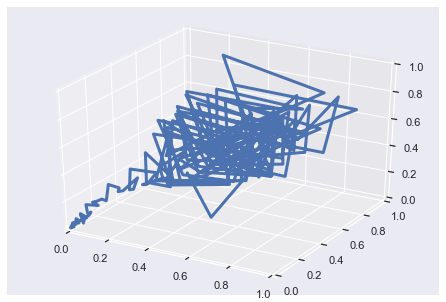

In [65]:
fig = plt.figure(17)
plt.clf()
axes = Axes3D(fig, xlim=(0, 1), ylim=(0, 1), zlim=(0, 1))

line, = axes.plot([], [], [], lw=3)

def init():
    line.set_data([], [], [])
    return line, 

def animate(i):
    X = np.array(MX_cases)[:-2].flatten()[:i]
    Y = np.roll(np.array(MX_cases), -tau_MX_cases)[:-2].flatten()[:i]
    Z = np.roll(np.array(MX_cases), -2 * tau_MX_cases)[:-2].flatten()[:i]
    line.set_data(X, Y)
    line.set_3d_properties(Z)
    return line,

anim = animation.FuncAnimation(fig, animate, # init_func=init,
                               frames=200, interval=40, blit=True)

from IPython.display import HTML
HTML(anim.to_jshtml())

### Calculemos el Maximo Coeficiente del Exponente de Lyapunov (MCLE) mediante $\texttt{tseriesChaos}$ de $\texttt{R}$

- series: time series.
- m: embedding dimension.
- d: time delay.
- t: Theiler window. Points separated by less than t in the series series are excluded from the search for neighbouring points. [Importante para que se tomen vecinos espaciales, y no dados por la dinámica (es decir, temporales)]
- k: number of neighbours considered.
- ref: number of points in series taken into account.
- s: iterations along which the neighbours of each point are followed.
- eps: radius of the ball inside which nearest neighbours are searched for. [Muy importante para que no se considere vecinos a distancias gigantes]

In [67]:
S_nu_MDF_MX = pd.read_csv(r'C:\Users\ignac\OneDrive - Universidad de Chile\Escritorio\Modelamietno Matematico\Chaos-Presence-SARS-CoV-II\data_para_R\S_nu_MDF_MX.csv')
S_nu_MDF_MX.head()

,S_nu_MDF_cases,S_nu_MX_cases,S_nu_MDF_deaths,S_nu_MX_deaths
0,-2.553997,-2.503761,-inf,-inf
1,-1.897796,-1.945880,-1.853094,-inf
2,-2.017807,-1.905643,-1.820425,-inf
3,-1.876269,-1.940873,-2.048681,-inf
4,-1.902849,-2.001377,-1.746853,-inf


In [74]:
S_nu_MDF_cases = S_nu_MDF_MX['S_nu_MDF_cases']
S_nu_MX_cases = S_nu_MDF_MX['S_nu_MX_cases']
S_nu_MDF_deaths = S_nu_MDF_MX['S_nu_MDF_deaths']
S_nu_MX_deaths = S_nu_MDF_MX['S_nu_MX_deaths']

nu = np.arange(len(S_nu_MDF_cases))

MCLE_MDF_cases, intercept, r_value, p_value, std_err = sp.stats.linregress(nu[3:30], S_nu_MDF_cases[3:30])

plt.figure(18, figsize=(16,4))
plt.clf()
plt.plot(nu, S_nu_MDF_cases, label='casos MDF')
plt.plot(nu, MCLE_MDF_cases*nu + intercept, linestyle='--', label='Slope = {:.4f}'.format(MCLE_MDF_cases), color='r')
plt.title('Promedio de divergencia entre dos trayectorias para MDF casos')
plt.ylabel('$S(\\nu)$')
plt.xlabel('$\\nu$')
plt.legend(loc=4)
plt.show()

nu = np.arange(len(S_nu_MX_cases))

MCLE_MX_cases, intercept, r_value, p_value, std_err = sp.stats.linregress(nu[3:30], S_nu_MX_cases[3:30])

plt.figure(19, figsize=(16,4))
plt.clf()
plt.plot(nu, S_nu_MX_cases, label='casos MX
plt.plot(nu, MCLE_MX_cases*nu + intercept, linestyle='--', label='Slope = {:.4f}'.format(MCLE_MX_cases), color='r')
plt.title('Promedio de divergencia entre dos trayectorias para MX casos')
plt.ylabel('$S(\\nu)$')
plt.xlabel('$\\nu$')
plt.legend(loc=4)
plt.show()

SyntaxError: EOL while scanning string literal (<ipython-input-74-b179d59b80fe>, line 26)

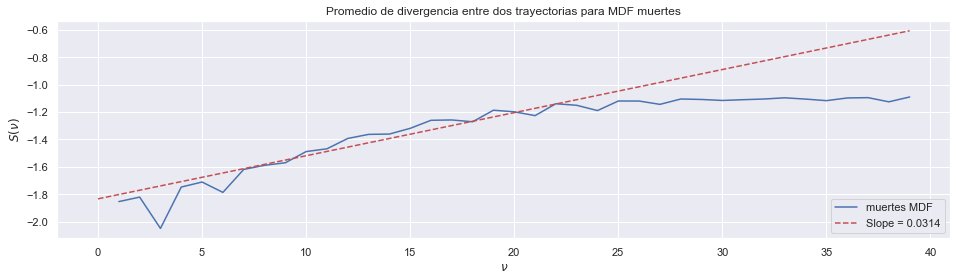

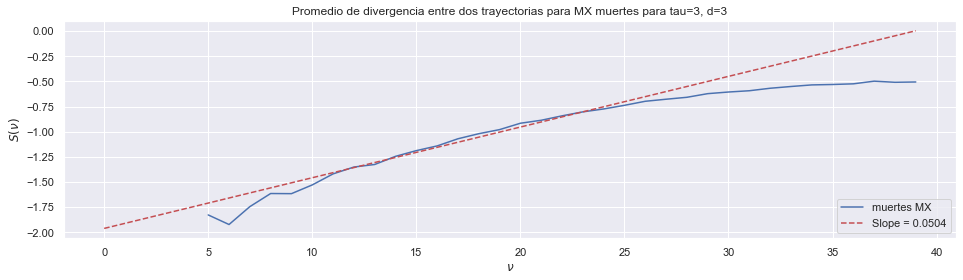

In [75]:
nu = np.arange(len(S_nu_MDF_deaths))

MCLE_MDF_deaths, intercept, r_value, p_value, std_err = sp.stats.linregress(nu[5:25], S_nu_MDF_deaths[5:25])

plt.figure(21, figsize=(16,4))
plt.clf()
plt.plot(nu, S_nu_MDF_deaths, label='muertes MDF')
plt.plot(nu, MCLE_MDF_deaths*nu + intercept, linestyle='--', label='Slope = {:.4f}'.format(MCLE_MDF_deaths), color='r')
plt.title('Promedio de divergencia entre dos trayectorias para MDF muertes')
plt.ylabel('$S(\\nu)$')
plt.xlabel('$\\nu$')
plt.legend(loc=4)
plt.show()


nu = np.arange(len(S_nu_MX_deaths))

MCLE_MX_deaths, intercept, r_value, p_value, std_err = sp.stats.linregress(nu[10:27], S_nu_MX_deaths[10:27])

plt.figure(22, figsize=(16,4))
plt.clf()
plt.plot(nu, S_nu_MX_deaths, label='muertes MX')
plt.plot(nu, MCLE_MX_deaths*nu + intercept, linestyle='--', label='Slope = {:.4f}'.format(MCLE_MX_deaths), color='r')
plt.title('Promedio de divergencia entre dos trayectorias para MX muertes para tau={}, d=3'.format(tau_MX_deaths))
plt.ylabel('$S(\\nu)$')
plt.xlabel('$\\nu$')
plt.legend(loc=4)
plt.show()

In [71]:
data = {'': ['MDF casos', 'MX casos', 'MDF muertes', 'MX muertes'], 'MCLE': 365*np.round([MCLE_MDF_cases, MCLE_MX_cases, MCLE_MDF_deaths, MCLE_MX_deaths], 5),'dim inmersion':['3', 4, '3-6','4-6'], 'delay': [5, 4, 3, 3], 'tw':[5, 8, 13, 13]}
NN = pd.DataFrame(data)
NN

,,MCLE,dim inmersion,delay,tw
0,MDF casos,9.69440,3,5,5
1,MX casos,9.92435,4,4,8
2,MDF muertes,11.47195,3-6,3,13
3,MX muertes,18.39965,4-6,3,13
